In [22]:

from PIL import Image
import cv2
import numpy as np
import time


In [23]:


def ssd(img_left, img_right, window_size, max_disparity, mode = "SAD"):
    """
    Sum of squared differences (SSD) matching function.

    Parameters:
    img_left (numpy.ndarray): Left image.
    img_right (numpy.ndarray): Right image.
    window_size (int): Size of the search window.
    max_disparity (int): Maximum disparity value.

    Returns:
    disparity_map (numpy.ndarray): Disparity map.
    """
    height, width = img_left.shape

    # Initialize disparity map
    disparity_map = np.zeros((height, width))

    # Iterate over each pixel in the left image
    for y in range(height-window_size+1):
        for x in range(width-window_size+1):
            # Initialize minimum SSD and disparity
            min_ssd = float('inf')
            disparity = 0

            # Search for matching window in the right image
            for d in range(max_disparity):
                # Check if the search window is within the bounds of the image
                if x - d - window_size // 2 < 0 or x - d + window_size // 2 >= width:
                    continue

                # Calculate SSD
                for k in range(int((-d+1)/2), int((d+1)/2), 1):
                    if x+k<0 or x+k>width-window_size:
                        ssd=10000000
                    else:
                        if mode == "SSD":
                            ssd = np.sum( (img_left[y:y+window_size , x:x+window_size ] - img_right[y:y+window_size , x+k:x+window_size+k]) ** 2)
                        elif mode == "SAD":
                            ssd = np.sum( np.abs(img_left[y:y+window_size , x:x+window_size ] - img_right[y:y+window_size , x+k:x+window_size+k]))
                        elif mode == "NC":
                            ssd=1-np.mean(np.multiply(img_left[y:y+window_size , x:x+window_size ]-np.mean(img_left[y:y+window_size , x:x+window_size ]), img_right[y:y+window_size , x+k:x+window_size+k]-np.mean(img_right[y:y+window_size , x+k:x+window_size+k])))/(np.std(img_left[y:y+window_size , x:x+window_size ])*np.std(img_right[y:y+window_size , x+k:x+window_size+k])+0.0001)

                    # Update minimum SSD and disparity
                    if ssd < min_ssd:
                        min_ssd = ssd
                        disparity = d

            # Store disparity value
            disparity_map[y, x] = disparity

    return disparity_map

In [24]:
import numpy as np
import matplotlib.pyplot as plt
def plot_image(img_array):
    # Plot the grayscale image
    plt.imshow(img_array, cmap='gray')
    plt.colorbar()  # Optional: adds a colorbar to the side
    plt.title('Grayscale Image')
    plt.axis('off')  # Optional: hides axis
    plt.show()


In [25]:
def min_max_normalize(data):
    """
    Apply min-max normalization to a NumPy array.
    
    Parameters:
    data (np.ndarray): The input data to be normalized.
    
    Returns:
    np.ndarray: The normalized data.
    """
    min_val = np.min(data)
    max_val = np.max(data)
    normalized_data = (data - min_val) / (max_val - min_val)
    return normalized_data


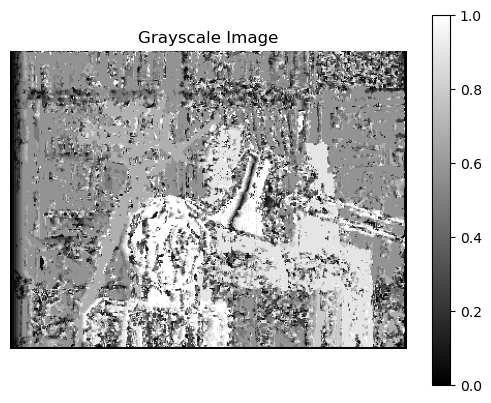

Running time (SSD, window_size=3, max_disparity=20): 124.62 seconds


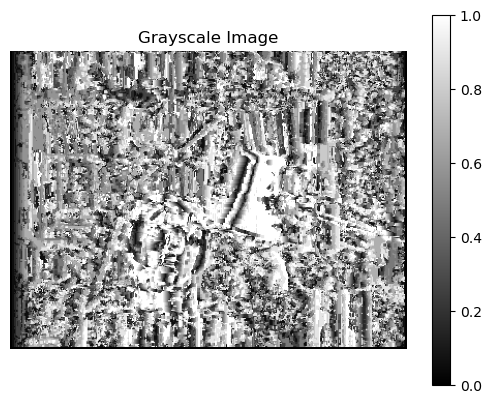

Running time (SAD, window_size=3, max_disparity=20): 121.61 seconds


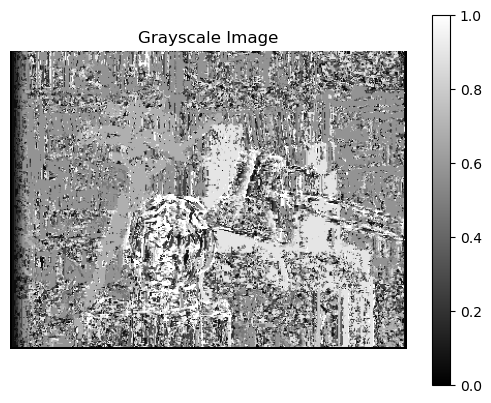

Running time (Normalized Correlation, window_size=3, max_disparity=20): 1213.71 seconds


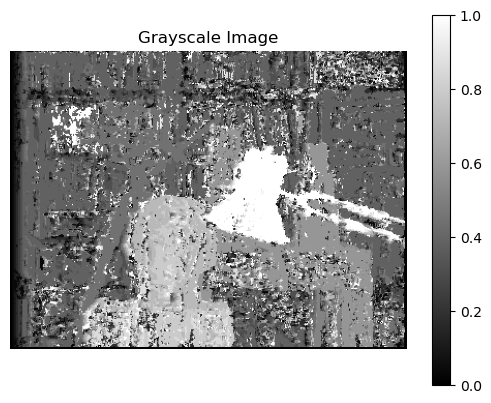

Running time (SSD, window_size=3, max_disparity=30): 262.37 seconds


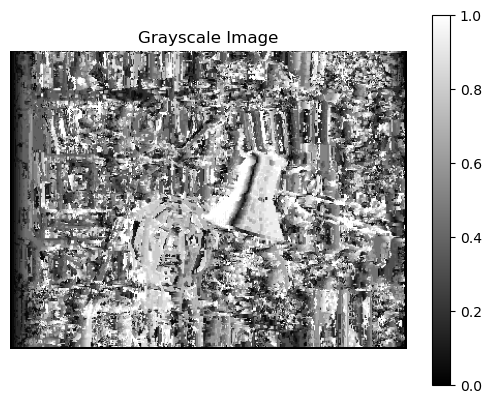

Running time (SAD, window_size=3, max_disparity=30): 266.93 seconds


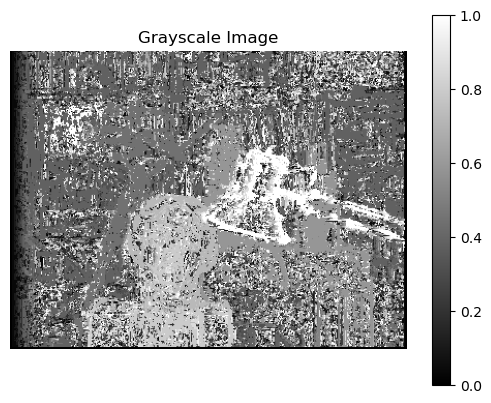

Running time (Normalized Correlation, window_size=3, max_disparity=30): 2841.18 seconds


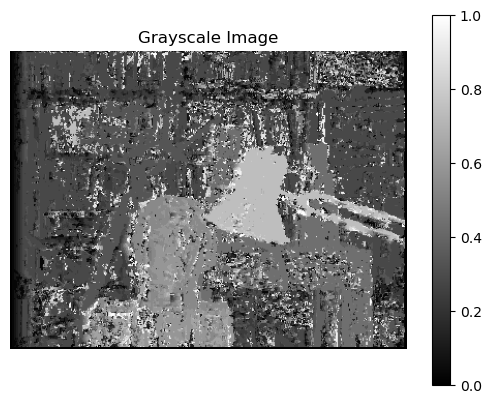

Running time (SSD, window_size=3, max_disparity=40): 468.23 seconds


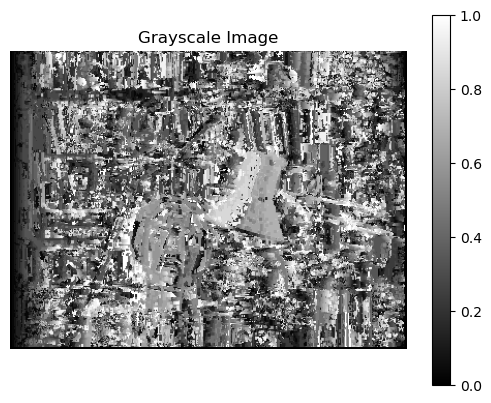

Running time (SAD, window_size=3, max_disparity=40): 461.27 seconds


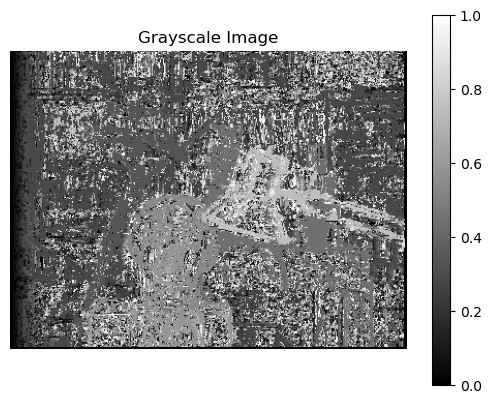

Running time (Normalized Correlation, window_size=3, max_disparity=40): 4679.49 seconds


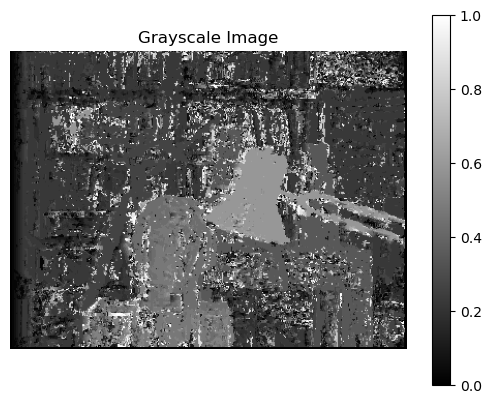

Running time (SSD, window_size=3, max_disparity=50): 674.05 seconds


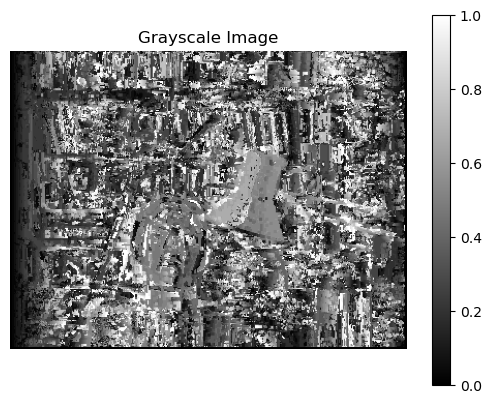

Running time (SAD, window_size=3, max_disparity=50): 661.23 seconds


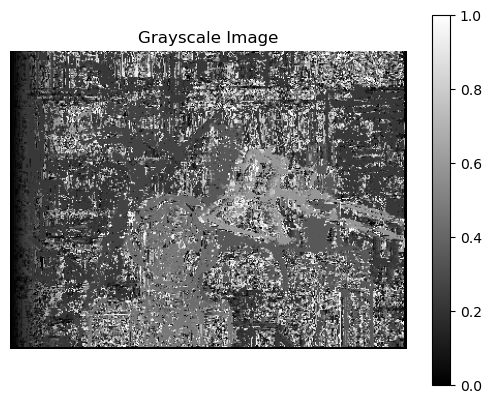

Running time (Normalized Correlation, window_size=3, max_disparity=50): 7012.46 seconds


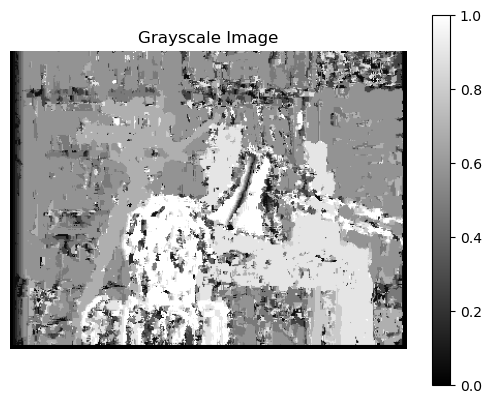

Running time (SSD, window_size=5, max_disparity=20): 107.48 seconds


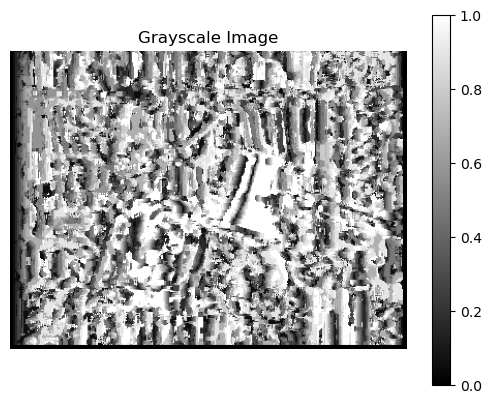

Running time (SAD, window_size=5, max_disparity=20): 106.73 seconds


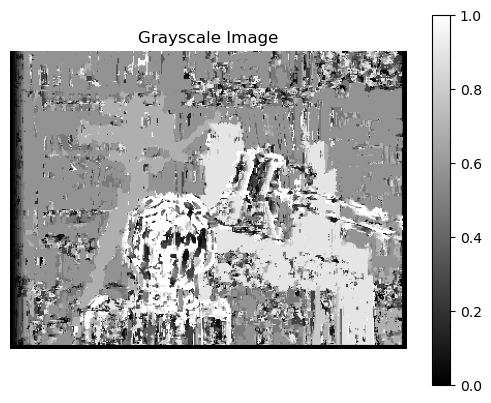

Running time (Normalized Correlation, window_size=5, max_disparity=20): 1114.41 seconds


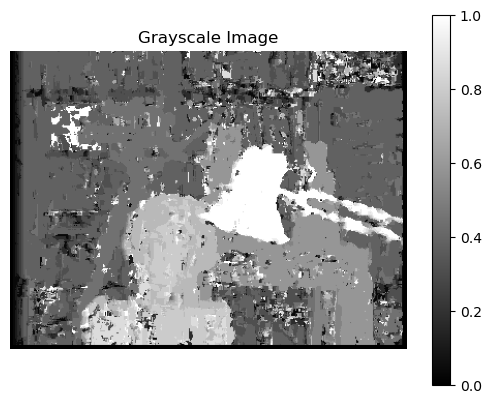

Running time (SSD, window_size=5, max_disparity=30): 244.85 seconds


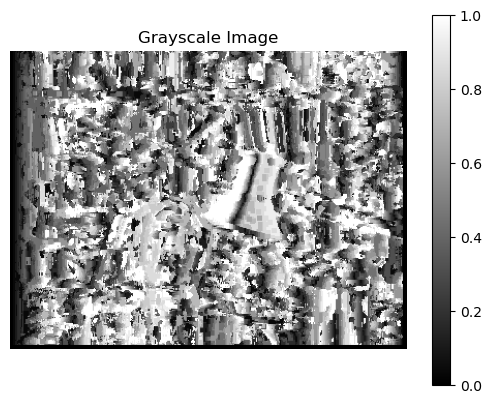

Running time (SAD, window_size=5, max_disparity=30): 240.24 seconds


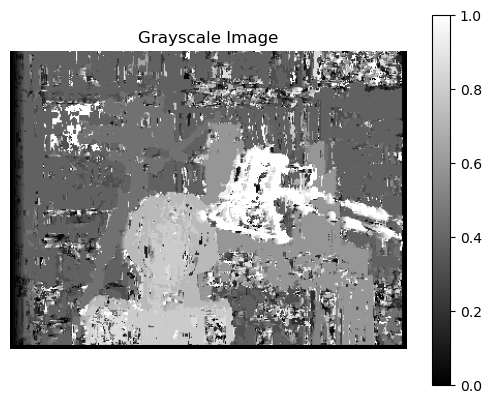

Running time (Normalized Correlation, window_size=5, max_disparity=30): 2514.93 seconds


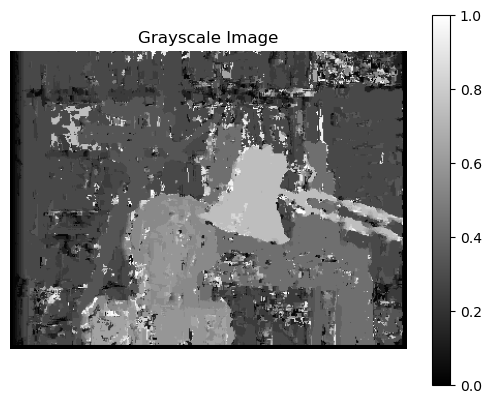

Running time (SSD, window_size=5, max_disparity=40): 428.90 seconds


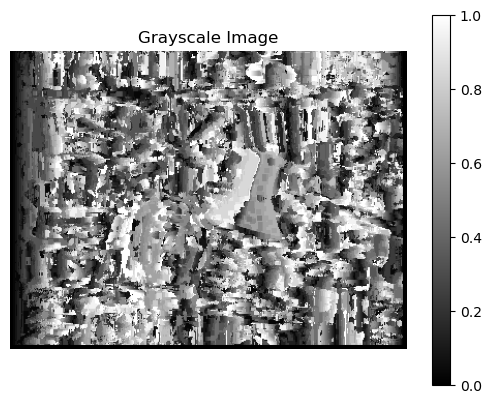

Running time (SAD, window_size=5, max_disparity=40): 424.42 seconds


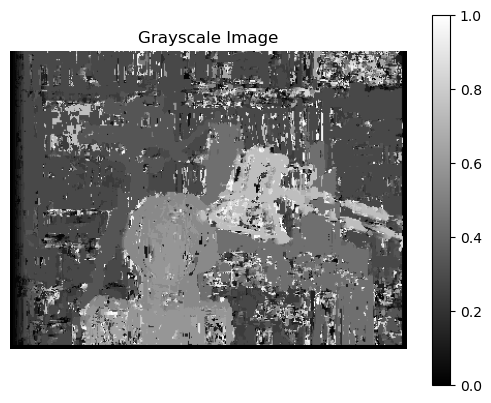

Running time (Normalized Correlation, window_size=5, max_disparity=40): 4501.15 seconds


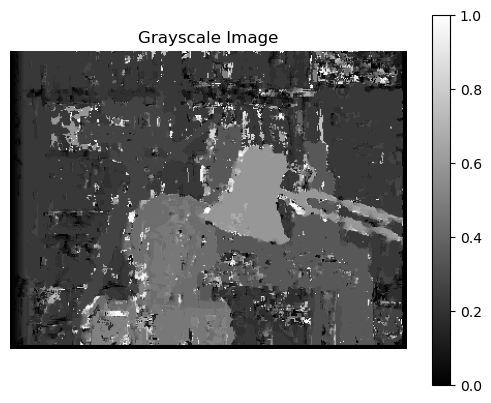

Running time (SSD, window_size=5, max_disparity=50): 666.82 seconds


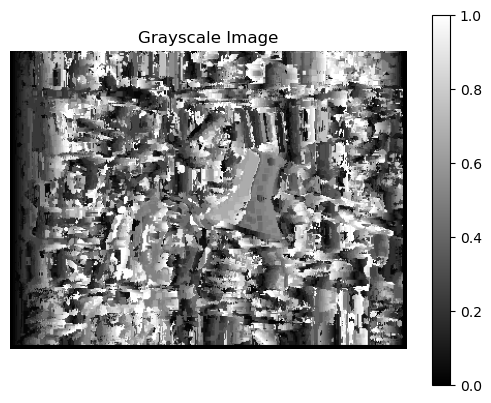

Running time (SAD, window_size=5, max_disparity=50): 658.06 seconds


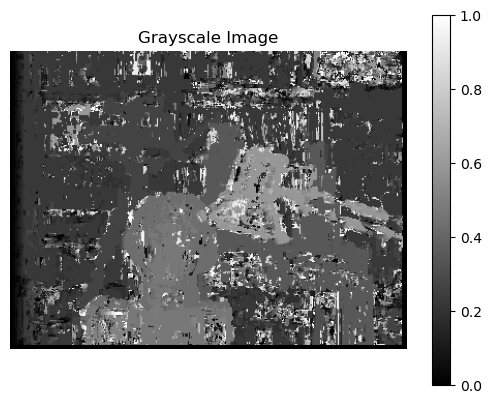

Running time (Normalized Correlation, window_size=5, max_disparity=50): 7116.63 seconds


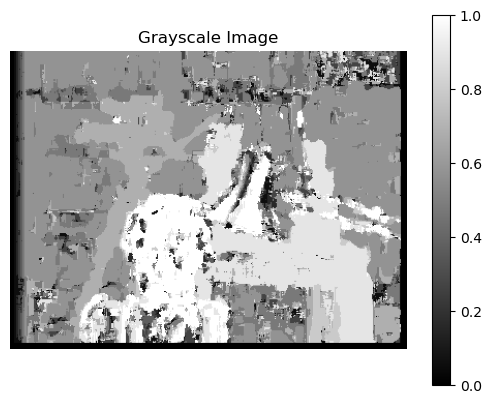

Running time (SSD, window_size=7, max_disparity=20): 109.05 seconds


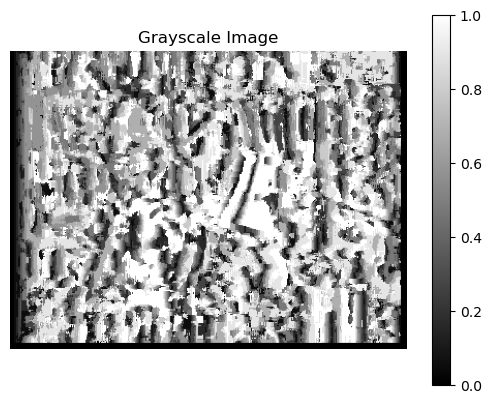

Running time (SAD, window_size=7, max_disparity=20): 106.86 seconds


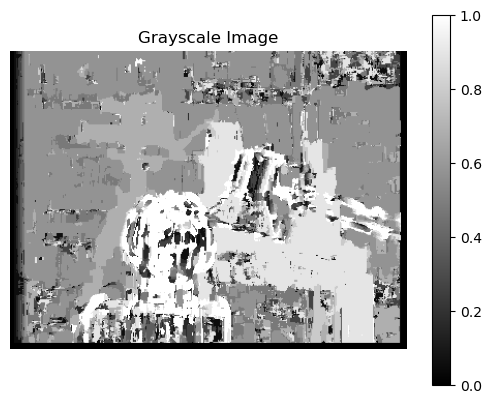

Running time (Normalized Correlation, window_size=7, max_disparity=20): 1271.71 seconds


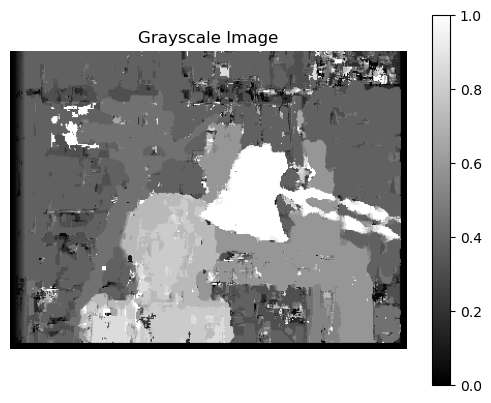

Running time (SSD, window_size=7, max_disparity=30): 325.17 seconds


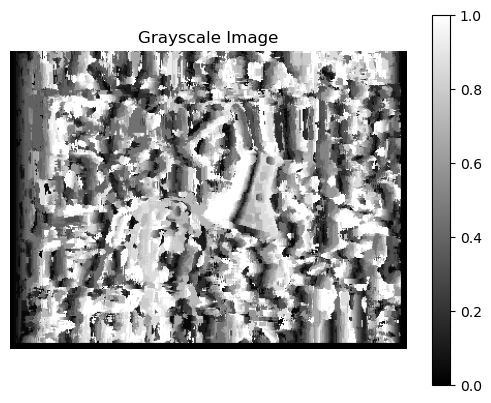

Running time (SAD, window_size=7, max_disparity=30): 329.60 seconds


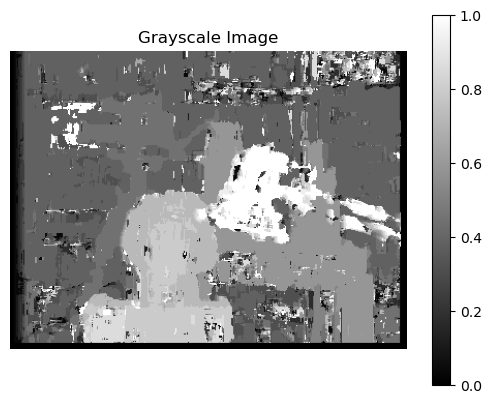

Running time (Normalized Correlation, window_size=7, max_disparity=30): 3084.54 seconds


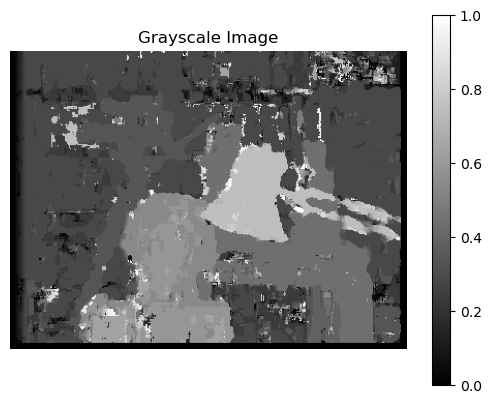

Running time (SSD, window_size=7, max_disparity=40): 495.21 seconds


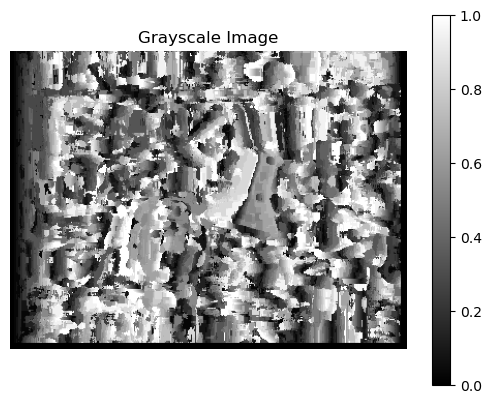

Running time (SAD, window_size=7, max_disparity=40): 515.93 seconds


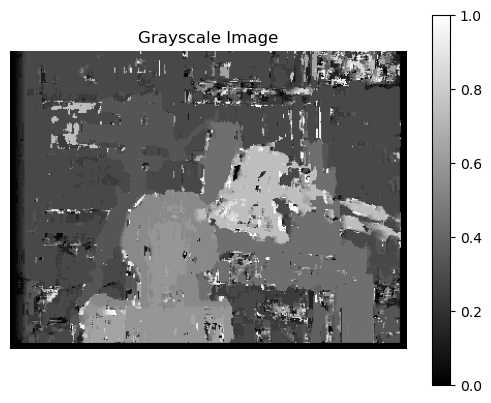

Running time (Normalized Correlation, window_size=7, max_disparity=40): 5376.03 seconds


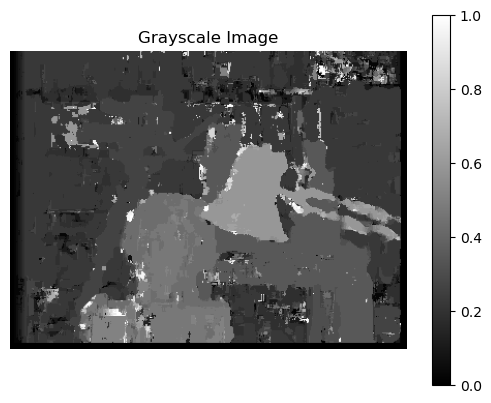

Running time (SSD, window_size=7, max_disparity=50): 779.17 seconds


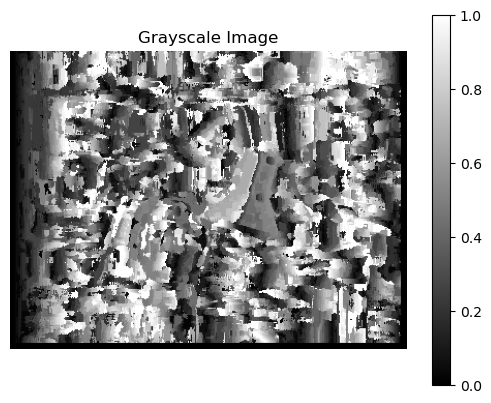

Running time (SAD, window_size=7, max_disparity=50): 767.06 seconds


KeyboardInterrupt: 

In [26]:

# Load left and right images
img_left = Image.open('mp5_part3_data/tsukuba1.jpg').convert('L')
img_right = Image.open('mp5_part3_data/tsukuba2.jpg').convert('L')

img_left = np.array(img_left)
img_right = np.array(img_right)

# img_left = min_max_normalize(img_left)
# img_left = min_max_normalize(img_left)


# Define window sizes and maximum disparity values
window_sizes = [3,5,7,11,15,20]
max_disparities = [20,30,40,50]

# Iterate over window sizes and maximum disparity values
for window_size in window_sizes:
    for max_disparity in max_disparities:
        # Measure running time
        start_time = time.time()
        # Compute disparity map using SSD
        disparity_map_ssd = ssd(img_left, img_right, window_size, max_disparity, mode="SSD")
        
        # Measure running time
        end_time = time.time()
        running_time = end_time - start_time

        plot_image(min_max_normalize(disparity_map_ssd))

        # Print running time
        print('Running time (SSD, window_size={}, max_disparity={}): {:.2f} seconds'.format(window_size, max_disparity, running_time))

        # SAD
        # Measure running time
        start_time = time.time()
        # Compute disparity map using SSD
        disparity_map_ssd = ssd(img_left, img_right, window_size, max_disparity, mode="SAD")
        
        # Measure running time
        end_time = time.time()
        running_time = end_time - start_time

        plot_image(min_max_normalize(disparity_map_ssd))

        print('Running time (SAD, window_size={}, max_disparity={}): {:.2f} seconds'.format(window_size, max_disparity, running_time))

        # Norm corr
        # Measure running time
        start_time = time.time()
        # Compute disparity map using SSD
        disparity_map_ssd = ssd(img_left, img_right, window_size, max_disparity, mode="NC")
        
        # Measure running time
        end_time = time.time()
        running_time = end_time - start_time

        plot_image(min_max_normalize(disparity_map_ssd))
        print('Running time (Normalized Correlation, window_size={}, max_disparity={}): {:.2f} seconds'.format(window_size, max_disparity, running_time))

# Save disparity maps
#cv2.imwrite('disparity_map_ssd.jpg', disparity_map_ssd)
# cv2.imwrite('disparity_map_sad.jpg', disparity_map_sad)
# cv2.imwrite('disparity_map_nc.jpg', disparity_map_nc)

other images

In [43]:
def part3(window_sizes, max_disparities, img_left, img_right, SSD=True, SAD=True, NC=False):
    # Iterate over window sizes and maximum disparity values
    for window_size in window_sizes:
        for max_disparity in max_disparities:
            if SSD:
                # Measure running time
                start_time = time.time()
                # Compute disparity map using SSD
                disparity_map_ssd = ssd(img_left, img_right, window_size, max_disparity, mode="SSD")
                
                # Measure running time
                end_time = time.time()
                running_time = end_time - start_time

                plot_image(min_max_normalize(disparity_map_ssd))

                # Print running time
                print('Running time (SSD, window_size={}, max_disparity={}): {:.2f} seconds'.format(window_size, max_disparity, running_time))

            # SAD
            if SAD:
                # Measure running time
                start_time = time.time()
                # Compute disparity map using SSD
                disparity_map_ssd = ssd(img_left, img_right, window_size, max_disparity, mode="SAD")
                
                # Measure running time
                end_time = time.time()
                running_time = end_time - start_time

                plot_image(min_max_normalize(disparity_map_ssd))

                print('Running time (SAD, window_size={}, max_disparity={}): {:.2f} seconds'.format(window_size, max_disparity, running_time))
            
            # Norm corr
            if NC:
                # Measure running time
                start_time = time.time()
                # Compute disparity map using SSD
                disparity_map_ssd = ssd(img_left, img_right, window_size, max_disparity, mode="NC")
                
                # Measure running time
                end_time = time.time()
                running_time = end_time - start_time

                plot_image(min_max_normalize(disparity_map_ssd))
                print('Running time (Normalized Correlation, window_size={}, max_disparity={}): {:.2f} seconds'.format(window_size, max_disparity, running_time))

(555, 695)


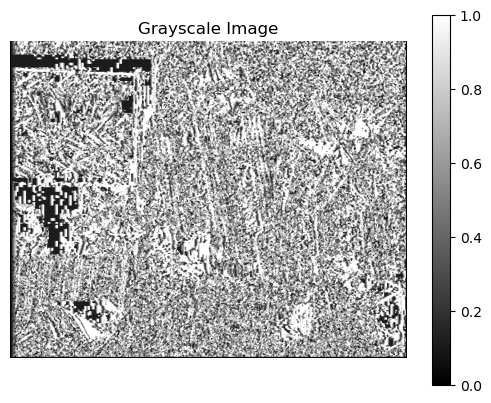

Running time (SSD, window_size=3, max_disparity=10): 120.51 seconds


KeyboardInterrupt: 

In [40]:

# Load left and right images
img_left = Image.open('mp5_part3_data/moebius1_s.jpg').convert('L')
img_right = Image.open('mp5_part3_data/moebius2_s.jpg').convert('L')



img_left = np.array(img_left)
img_right = np.array(img_right)

print(img_left.shape)

# img_left = min_max_normalize(img_left)
# img_left = min_max_normalize(img_left)


# Define window sizes and maximum disparity values
window_sizes = [3,7]
max_disparities = [10,50]

part3(window_sizes, max_disparities, img_left, img_right)


Note: the images are huge so i reduced the size


(555, 695)


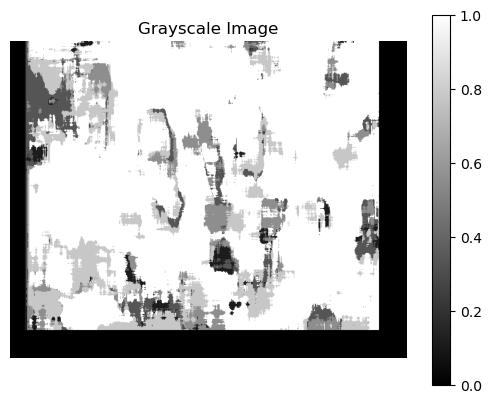

Running time (SSD, window_size=50, max_disparity=10): 130.29 seconds


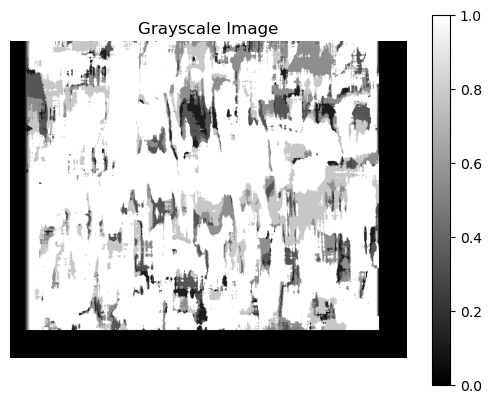

Running time (SAD, window_size=50, max_disparity=10): 126.69 seconds


KeyboardInterrupt: 

In [42]:

# Load left and right images
img_left = Image.open('mp5_part3_data/moebius1_s.jpg').convert('L')
img_right = Image.open('mp5_part3_data/moebius2_s.jpg').convert('L')



img_left = np.array(img_left)
img_right = np.array(img_right)

print(img_left.shape)

# img_left = min_max_normalize(img_left)
# img_left = min_max_normalize(img_left)


# Define window sizes and maximum disparity values
window_sizes = [50]
max_disparities = [10,50]

part3(window_sizes, max_disparities, img_left, img_right, SSD=True, SAD=True,NC=False)


(555, 695)


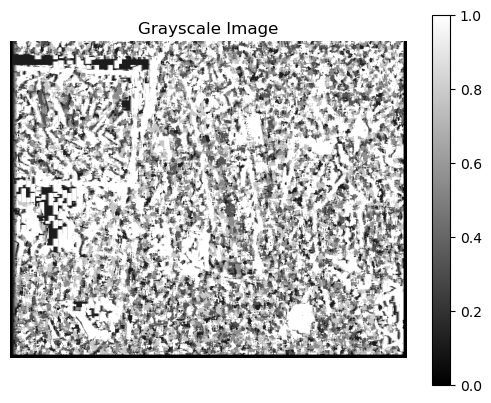

Running time (SSD, window_size=7, max_disparity=10): 125.67 seconds


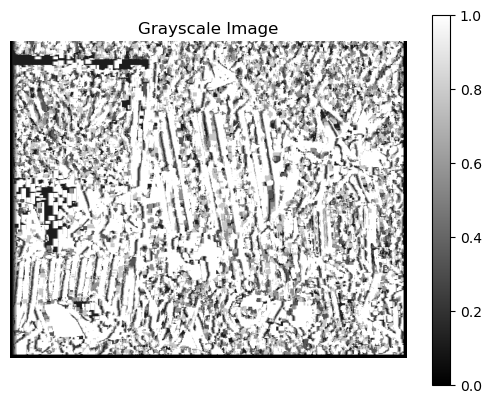

Running time (SAD, window_size=7, max_disparity=10): 127.89 seconds


In [ ]:

# Load left and right images
img_left = Image.open('mp5_part3_data/moebius1_s.jpg').convert('L')
img_right = Image.open('mp5_part3_data/moebius2_s.jpg').convert('L')



img_left = np.array(img_left)
img_right = np.array(img_right)

print(img_left.shape)

# img_left = min_max_normalize(img_left)
# img_left = min_max_normalize(img_left)


# Define window sizes and maximum disparity values
window_sizes = [7,11]
max_disparities = [50]

part3(window_sizes, max_disparities, img_left, img_right, SSD=True, SAD=True,NC=False)

(1110, 1390)


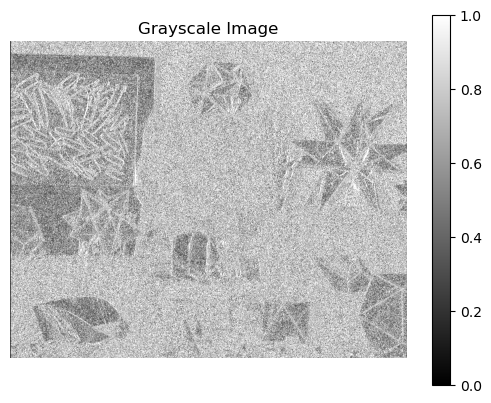

Running time (SSD, window_size=1, max_disparity=5): 90.59 seconds


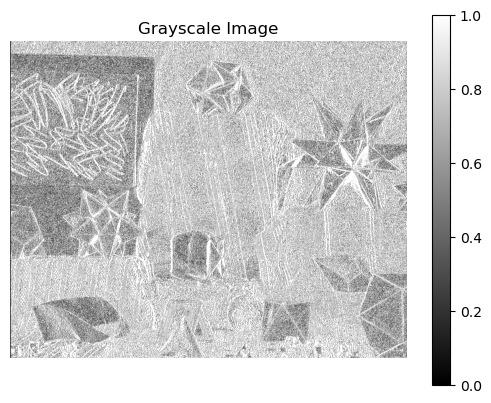

Running time (SAD, window_size=1, max_disparity=5): 92.22 seconds


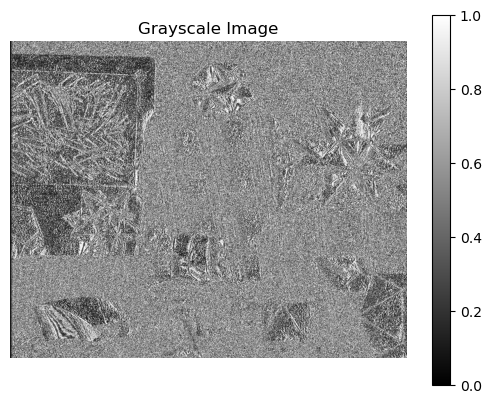

Running time (SSD, window_size=1, max_disparity=10): 428.46 seconds


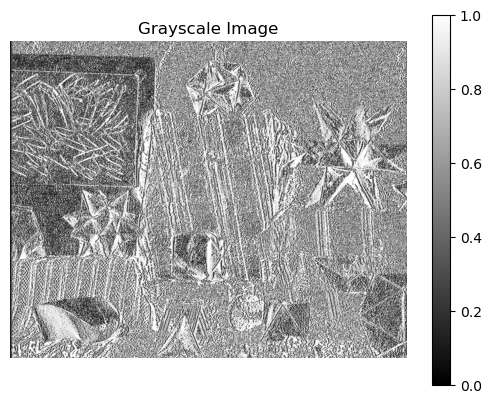

Running time (SAD, window_size=1, max_disparity=10): 430.39 seconds


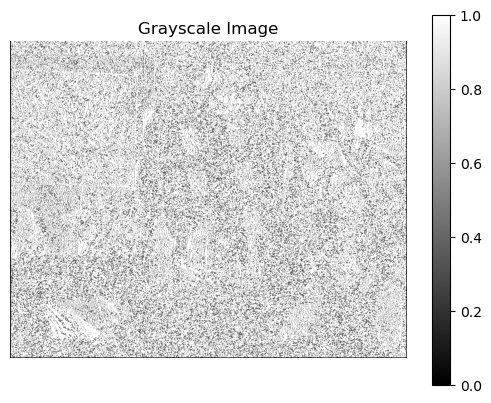

Running time (SSD, window_size=3, max_disparity=5): 108.56 seconds


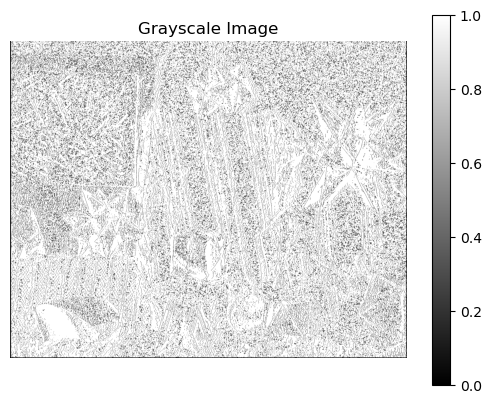

Running time (SAD, window_size=3, max_disparity=5): 107.42 seconds


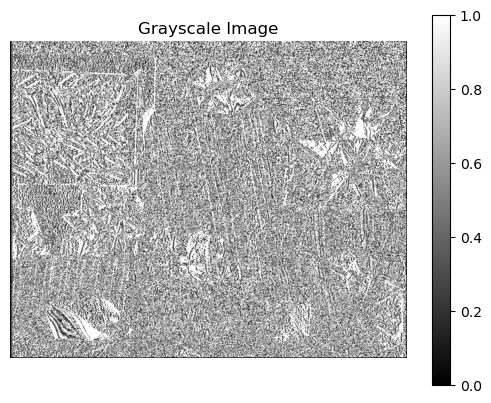

Running time (SSD, window_size=3, max_disparity=10): 453.86 seconds


KeyboardInterrupt: 

In [47]:

# Load left and right images
img_left = Image.open('mp5_part3_data/moebius1.jpg').convert('L')
img_right = Image.open('mp5_part3_data/moebius2.jpg').convert('L')



img_left = np.array(img_left)
img_right = np.array(img_right)

print(img_left.shape)

# img_left = min_max_normalize(img_left)
# img_left = min_max_normalize(img_left)


# Define window sizes and maximum disparity values
window_sizes = [1,3]
max_disparities = [5,10]

part3(window_sizes, max_disparities, img_left, img_right, SSD=True, SAD=True,NC=False)

In [ ]:

# Load left and right images
img_left = Image.open('mp5_part3_data/moebius1.jpg').convert('L')
img_right = Image.open('mp5_part3_data/moebius2.jpg').convert('L')



img_left = np.array(img_left)
img_right = np.array(img_right)

print(img_left.shape)

# img_left = min_max_normalize(img_left)
# img_left = min_max_normalize(img_left)


# Define window sizes and maximum disparity values
window_sizes = [1]
max_disparities = [20]

part3(window_sizes, max_disparities, img_left, img_right, SSD=True, SAD=True,NC=False)

(1110, 1390)
